##### Copyright 2019 The TensorFlow Authors.

In [1]:
#@title Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# CycleGAN

<table class="tfo-notebook-buttons" align="left">
  <td>
    <a target="_blank" href="https://www.tensorflow.org/tutorials/generative/cyclegan"><img src="https://www.tensorflow.org/images/tf_logo_32px.png" />View on TensorFlow.org</a>
  </td>
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/generative/cyclegan.ipynb"><img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Run in Google Colab</a>
  </td>
  <td>
    <a target="_blank" href="https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/cyclegan.ipynb"><img src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />View source on GitHub</a>
  </td>
  <td>
    <a href="https://storage.googleapis.com/tensorflow_docs/docs/site/en/tutorials/generative/cyclegan.ipynb"><img src="https://www.tensorflow.org/images/download_logo_32px.png" />Download notebook</a>
  </td>
</table>

This notebook demonstrates unpaired image to image translation using conditional GAN's, as described in [Unpaired Image-to-Image Translation using Cycle-Consistent Adversarial Networks](https://arxiv.org/abs/1703.10593), also known as CycleGAN. The paper proposes a method that can capture the characteristics of one image domain and figure out how these characteristics could be translated into another image domain, all in the absence of any paired training examples.

This notebook assumes you are familiar with Pix2Pix, which you can learn about in the [Pix2Pix tutorial](https://www.tensorflow.org/tutorials/generative/pix2pix). The code for CycleGAN is similar, the main difference is an additional loss function, and the use of unpaired training data.

CycleGAN uses a cycle consistency loss to enable training without the need for paired data. In other words, it can translate from one domain to another without a one-to-one mapping between the source and target domain.

## Set up the input pipeline

Install the [tensorflow_examples](https://github.com/tensorflow/examples) package that enables importing of the generator and the discriminator.

In [2]:
!pip install git+https://github.com/tensorflow/examples.git

  Cloning https://github.com/tensorflow/examples.git to /private/var/folders/m0/tjc4brxn6yg1p0gvqc_rdq540000gn/T/pip-req-build-gpccg_up
  Running command git clone --filter=blob:none --quiet https://github.com/tensorflow/examples.git /private/var/folders/m0/tjc4brxn6yg1p0gvqc_rdq540000gn/T/pip-req-build-gpccg_up
  Resolved https://github.com/tensorflow/examples.git to commit 652ee34ff046946c36b8aed5d97ecebab0699f7e
  Preparing metadata (setup.py) ... done


In [1]:
import tensorflow as tf
import PIL
import PIL.Image
import tensorflow_datasets as tfds
from tensorflow_examples.models.pix2pix import pix2pix
import pathlib

import os
import time
import matplotlib.pyplot as plt
from IPython.display import clear_output

AUTOTUNE = tf.data.AUTOTUNE

/opt/anaconda3/envs/draw2pix/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Input Pipeline

This tutorial trains a model to translate from images of horses, to images of zebras. You can find this dataset and similar ones [here](https://www.tensorflow.org/datasets/catalog/cycle_gan).

As mentioned in the [paper](https://arxiv.org/abs/1703.10593), apply random jittering and mirroring to the training dataset. These are some of the image augmentation techniques that avoids overfitting.

This is similar to what was done in [pix2pix](https://www.tensorflow.org/tutorials/generative/pix2pix#load_the_dataset)

* In random jittering, the image is resized to `286 x 286` and then randomly cropped to `256 x 256`.
* In random mirroring, the image is randomly flipped horizontally i.e., left to right.

In [2]:
data_dir = pathlib.Path("../dataset/draw2pix/")

BUFFER_SIZE = 1000
BATCH_SIZE = 32
IMG_HEIGHT = 256
IMG_WIDTH = 256

train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(IMG_HEIGHT, IMG_WIDTH),
  batch_size=None)

test_ds= tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(IMG_HEIGHT, IMG_WIDTH),
  batch_size=None)

Found 8235 files belonging to 2 classes.
Using 6588 files for training.


2025-01-05 13:15:35.696676: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M3
2025-01-05 13:15:35.696716: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 24.00 GB
2025-01-05 13:15:35.696727: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 8.00 GB
2025-01-05 13:15:35.696752: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2025-01-05 13:15:35.696769: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Found 8235 files belonging to 2 classes.
Using 1647 files for validation.


In [3]:
train_ds.take(1)

<_TakeDataset element_spec=(TensorSpec(shape=(256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int32, name=None))>

In [4]:
class_names = train_ds.class_names
print(class_names)

['Multi-cell pixel art', 'Non-pixel art']


In [5]:
pix = class_names.index('Multi-cell pixel art')
draw = class_names.index('Non-pixel art')

def filter_by_class(dataset, class_index):
  return dataset.filter(lambda image, label: tf.reduce_all(tf.equal(label, class_index)))

# Split the train dataset into pix and draw
train_pix = filter_by_class(train_ds, pix)
train_draw = filter_by_class(train_ds, draw)

# Split the test dataset into pix and draw
test_pix = filter_by_class(test_ds, pix)
test_draw = filter_by_class(test_ds, draw)

In [6]:
def random_crop(image):
  cropped_image = tf.image.random_crop(image, size=[IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image

# normalizing the images to [-1, 1]
def normalize(image):
  image = tf.cast(image, tf.float32)
  image = (image / 127.5) - 1
  return image


def random_jitter(image):
  # resizing to 286 x 286 x 3
  image = tf.image.resize(image, [286, 286],
                          method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  # randomly cropping to 256 x 256 x 3
  image = random_crop(image)
  # random mirroring
  image = tf.image.random_flip_left_right(image)
  return image


def preprocess_image_train(image, label=""):
  image = random_jitter(image)
  image = normalize(image)
  return image

def preprocess_image_test(image, label=""):
  image = normalize(image)
  return image

In [7]:
train_pix = train_pix.cache().map(
    preprocess_image_train, num_parallel_calls=AUTOTUNE).shuffle(
    BUFFER_SIZE).batch(BATCH_SIZE)

train_draw = train_draw.cache().map(
    preprocess_image_train, num_parallel_calls=AUTOTUNE).shuffle(
    BUFFER_SIZE).batch(BATCH_SIZE)

test_pix = test_pix.map(
    preprocess_image_test, num_parallel_calls=AUTOTUNE).cache().shuffle(
    BUFFER_SIZE).batch(BATCH_SIZE)

test_draw = test_draw.map(
    preprocess_image_test, num_parallel_calls=AUTOTUNE).cache().shuffle(
    BUFFER_SIZE).batch(BATCH_SIZE)

In [10]:
sample_pix = next(iter(train_pix))
sample_draw = next(iter(train_draw))

2025-01-05 13:16:41.278338: W tensorflow/core/kernels/data/cache_dataset_ops.cc:858] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.
2025-01-05 13:16:42.940926: W tensorflow/core/kernels/data/cache_dataset_ops.cc:858] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


In [24]:
sample_draw.shape

TensorShape([32, 256, 256, 3])

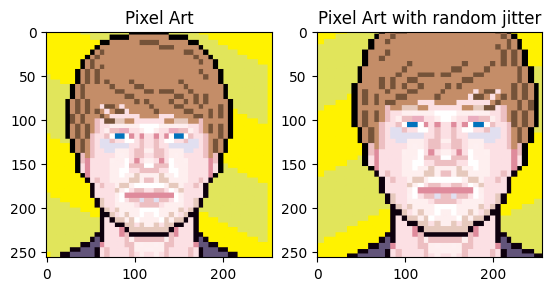

In [25]:
plt.subplot(121)
plt.title('Pixel Art')
plt.imshow(sample_pix[0] * 0.5 + 0.5)

plt.subplot(122)
plt.title('Pixel Art with random jitter')
plt.imshow(random_jitter(sample_pix[0]) * 0.5 + 0.5)

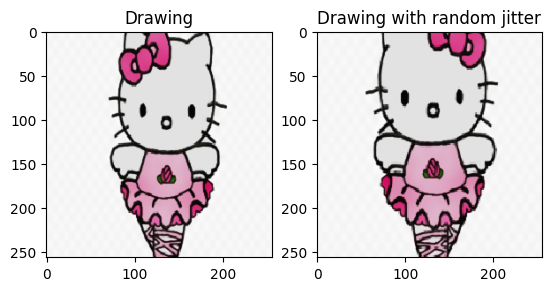

In [26]:
plt.subplot(121)
plt.title('Drawing')
plt.imshow(sample_draw[0] * 0.5 + 0.5)

plt.subplot(122)
plt.title('Drawing with random jitter')
plt.imshow(random_jitter(sample_draw[0]) * 0.5 + 0.5)

## Import and reuse the Pix2Pix models

Import the generator and the discriminator used in [Pix2Pix](https://github.com/tensorflow/examples/blob/master/tensorflow_examples/models/pix2pix/pix2pix.py) via the installed [tensorflow_examples](https://github.com/tensorflow/examples) package.

The model architecture used in this tutorial is very similar to what was used in [pix2pix](https://github.com/tensorflow/examples/blob/master/tensorflow_examples/models/pix2pix/pix2pix.py). Some of the differences are:

* Cyclegan uses [instance normalization](https://arxiv.org/abs/1607.08022) instead of [batch normalization](https://arxiv.org/abs/1502.03167).
* The [CycleGAN paper](https://arxiv.org/abs/1703.10593) uses a modified `resnet` based generator. This tutorial is using a modified `unet` generator for simplicity.

There are 2 generators (G and F) and 2 discriminators (X and Y) being trained here.

* Generator `G` learns to transform image `X` to image `Y`. $(G: X -> Y)$
* Generator `F` learns to transform image `Y` to image `X`. $(F: Y -> X)$
* Discriminator `D_X` learns to differentiate between image `X` and generated image `X` (`F(Y)`).
* Discriminator `D_Y` learns to differentiate between image `Y` and generated image `Y` (`G(X)`).

![Cyclegan model](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/images/cyclegan_model.png?raw=1)

In [8]:
OUTPUT_CHANNELS = 3

generator_g = pix2pix.unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')
generator_f = pix2pix.unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')

discriminator_x = pix2pix.discriminator(norm_type='instancenorm', target=False)
discriminator_y = pix2pix.discriminator(norm_type='instancenorm', target=False)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.3071263..4.0934987].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.916743..4.0391526].


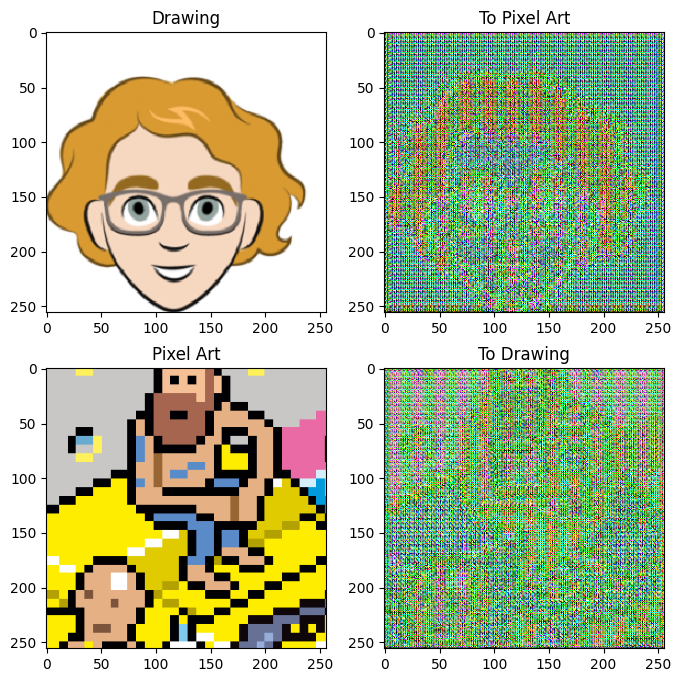

In [11]:
to_pix = generator_g(sample_draw)
to_draw = generator_f(sample_pix)
plt.figure(figsize=(8, 8))
contrast = 8

imgs = [sample_draw, to_pix, sample_pix, to_draw]
title = ['Drawing', 'To Pixel Art', 'Pixel Art', 'To Drawing']

for i in range(len(imgs)):
  plt.subplot(2, 2, i+1)
  plt.title(title[i])
  if i % 2 == 0:
    plt.imshow(imgs[i][0] * 0.5 + 0.5)
  else:
    plt.imshow(imgs[i][0] * 0.5 * contrast + 0.5)
plt.show()

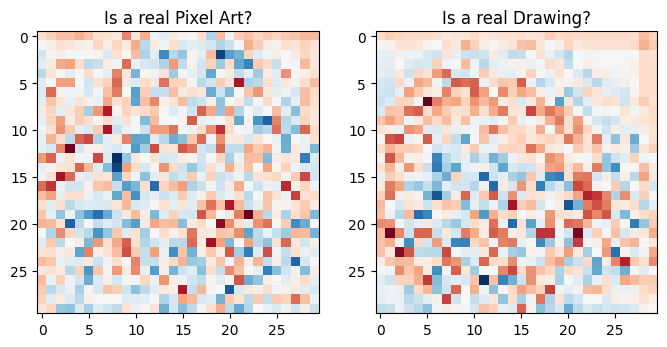

In [12]:
plt.figure(figsize=(8, 8))

plt.subplot(121)
plt.title('Is a real Pixel Art?')
plt.imshow(discriminator_y(sample_pix)[0, ..., -1], cmap='RdBu_r')

plt.subplot(122)
plt.title('Is a real Drawing?')
plt.imshow(discriminator_x(sample_draw)[0, ..., -1], cmap='RdBu_r')

plt.show()

## Loss functions

In CycleGAN, there is no paired data to train on, hence there is no guarantee that the input `x` and the target `y` pair are meaningful during training. Thus in order to enforce that the network learns the correct mapping, the authors propose the cycle consistency loss.

The discriminator loss and the generator loss are similar to the ones used in [pix2pix](https://www.tensorflow.org/tutorials/generative/pix2pix#build_the_generator).

In [13]:
LAMBDA = 10

In [14]:
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [15]:
def discriminator_loss(real, generated):
  real_loss = loss_obj(tf.ones_like(real), real)

  generated_loss = loss_obj(tf.zeros_like(generated), generated)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss * 0.5

In [16]:
def generator_loss(generated):
  return loss_obj(tf.ones_like(generated), generated)

Cycle consistency means the result should be close to the original input. For example, if one translates a sentence from English to French, and then translates it back from French to English, then the resulting sentence should be the same as the  original sentence.

In cycle consistency loss,

* Image $X$ is passed via generator $G$ that yields generated image $\hat{Y}$.
* Generated image $\hat{Y}$ is passed via generator $F$ that yields cycled image $\hat{X}$.
* Mean absolute error is calculated between $X$ and $\hat{X}$.

$$forward\ cycle\ consistency\ loss: X -> G(X) -> F(G(X)) \sim \hat{X}$$

$$backward\ cycle\ consistency\ loss: Y -> F(Y) -> G(F(Y)) \sim \hat{Y}$$


![Cycle loss](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/images/cycle_loss.png?raw=1)

In [17]:
def calc_cycle_loss(real_image, cycled_image):
  loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))

  return LAMBDA * loss1

As shown above, generator $G$ is responsible for translating image $X$ to image $Y$. Identity loss says that, if you fed image $Y$ to generator $G$, it should yield the real image $Y$ or something close to image $Y$.

If you run the zebra-to-horse model on a horse or the horse-to-zebra model on a zebra, it should not modify the image much since the image already contains the target class.

$$Identity\ loss = |G(Y) - Y| + |F(X) - X|$$

In [18]:
def identity_loss(real_image, same_image):
  loss = tf.reduce_mean(tf.abs(real_image - same_image))
  return LAMBDA * 0.5 * loss

Initialize the optimizers for all the generators and the discriminators.

In [19]:
generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

## Checkpoints

In [20]:
checkpoint_path = "./checkpoints/draw2pix/cycleGanPix2Pix/train"

if not os.path.exists(checkpoint_path):
    print(f"Checkpoint path doesn't exist: {checkpoint_path}")
else:
    print(f"Checkpoint path exists, listing files in {checkpoint_path}:")
    print(os.listdir(checkpoint_path))  # Lists the files in the checkpoint directory

ckpt = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f,
                           discriminator_x=discriminator_x,
                           discriminator_y=discriminator_y,
                           generator_g_optimizer=generator_g_optimizer,
                           generator_f_optimizer=generator_f_optimizer,
                           discriminator_x_optimizer=discriminator_x_optimizer,
                           discriminator_y_optimizer=discriminator_y_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
  ckpt.restore(ckpt_manager.latest_checkpoint)
  print ('Latest checkpoint restored!!')

Checkpoint path exists, listing files in ./checkpoints/draw2pix/cycleGanPix2Pix/train:
['ckpt-43.data-00000-of-00001', 'ckpt-42.data-00000-of-00001', 'ckpt-41.data-00000-of-00001', 'ckpt-40.data-00000-of-00001', 'ckpt-46.data-00000-of-00001', 'checkpoint', 'ckpt-47.data-00000-of-00001', 'ckpt-44.data-00000-of-00001', 'ckpt-45.data-00000-of-00001', 'ckpt-44.index', 'ckpt-46.index', 'ckpt-42.index', 'ckpt-38.index', 'ckpt-40.index', 'ckpt-47.index', 'ckpt-45.index', 'ckpt-41.index', 'ckpt-38.data-00000-of-00001', 'ckpt-39.index', 'ckpt-39.data-00000-of-00001', 'ckpt-43.index']
Latest checkpoint restored!!


## Training

Note: This example model is trained for fewer epochs (10) than the paper (200) to keep training time reasonable for this tutorial. The generated images will have much lower quality.

In [38]:
EPOCHS = 50

In [22]:
def generate_images(model, test_input):
  prediction = model(test_input)

  plt.figure(figsize=(12, 12))

  display_list = [test_input[0], prediction[0]]
  title = ['Input Image', 'Predicted Image']

  for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

Even though the training loop looks complicated, it consists of four basic steps:

* Get the predictions.
* Calculate the loss.
* Calculate the gradients using backpropagation.
* Apply the gradients to the optimizer.

In [40]:
@tf.function
def train_step(real_x, real_y):
  # persistent is set to True because the tape is used more than
  # once to calculate the gradients.
  with tf.GradientTape(persistent=True) as tape:
    # Generator G translates X -> Y
    # Generator F translates Y -> X.

    fake_y = generator_g(real_x, training=True)
    cycled_x = generator_f(fake_y, training=True)

    fake_x = generator_f(real_y, training=True)
    cycled_y = generator_g(fake_x, training=True)

    # same_x and same_y are used for identity loss.
    same_x = generator_f(real_x, training=True)
    same_y = generator_g(real_y, training=True)

    disc_real_x = discriminator_x(real_x, training=True)
    disc_real_y = discriminator_y(real_y, training=True)

    disc_fake_x = discriminator_x(fake_x, training=True)
    disc_fake_y = discriminator_y(fake_y, training=True)

    # calculate the loss
    gen_g_loss = generator_loss(disc_fake_y)
    gen_f_loss = generator_loss(disc_fake_x)

    total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)

    # Total generator loss = adversarial loss + cycle loss
    total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
    total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)

    disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
    disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)

  # Calculate the gradients for generator and discriminator
  generator_g_gradients = tape.gradient(total_gen_g_loss,
                                        generator_g.trainable_variables)
  generator_f_gradients = tape.gradient(total_gen_f_loss,
                                        generator_f.trainable_variables)

  discriminator_x_gradients = tape.gradient(disc_x_loss,
                                            discriminator_x.trainable_variables)
  discriminator_y_gradients = tape.gradient(disc_y_loss,
                                            discriminator_y.trainable_variables)

  # Apply the gradients to the optimizer
  generator_g_optimizer.apply_gradients(zip(generator_g_gradients,
                                            generator_g.trainable_variables))

  generator_f_optimizer.apply_gradients(zip(generator_f_gradients,
                                            generator_f.trainable_variables))

  discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients,
                                                discriminator_x.trainable_variables))

  discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients,
                                                discriminator_y.trainable_variables))

In [41]:
num_batches = sum(1 for _ in train_draw)
print(f"Number of batches in train_draw: {num_batches}")

Number of batches in train_draw: 33


2025-01-05 02:29:50.469496: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


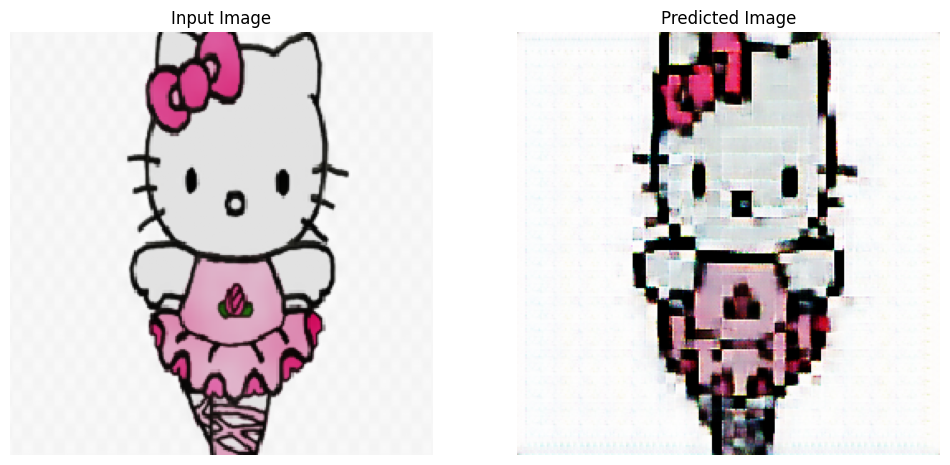

Time taken for epoch 47 is 1020.90 sec

Processed 33 batches this epoch.
Saving checkpoint for epoch 47 at ./checkpoints/draw2pix/cycleGanPix2Pix/train/ckpt-47


Epoch 48/50:  24%|██▍       | 8/33 [04:15<13:08, 31.53s/batch]

In [29]:
from tqdm import tqdm

for epoch in range(EPOCHS):
  start = time.time()

  n = 0
  # Create a tqdm progress bar for the dataset
  progress_bar = tqdm(tf.data.Dataset.zip((train_draw, train_pix)), 
                        total=num_batches,  # total is the number of batches
                        desc=f"Epoch {epoch + 1}/{EPOCHS}",  # Description with current epoch
                        unit="batch")  # Unit to show in progress bar

  # Iterate through the dataset with tqdm's progress bar
  for i, (image_x, image_y) in enumerate(progress_bar):
    train_step(image_x, image_y)
    n += 1

  clear_output(wait=True)
  # Using a consistent image (sample_draw) so that the progress of the model
  # is clearly visible.
  generate_images(generator_g, sample_draw)

  print(f'Time taken for epoch {epoch + 1} is {time.time() - start:.2f} sec\n')
  print(f"Processed {n} batches this epoch.")
  ckpt_save_path = ckpt_manager.save()
  if ckpt_save_path:
    print(f'Saving checkpoint for epoch {epoch+1} at {ckpt_save_path}')
  else:
    print("Checkpoint saving failed.")


## Generate using test dataset

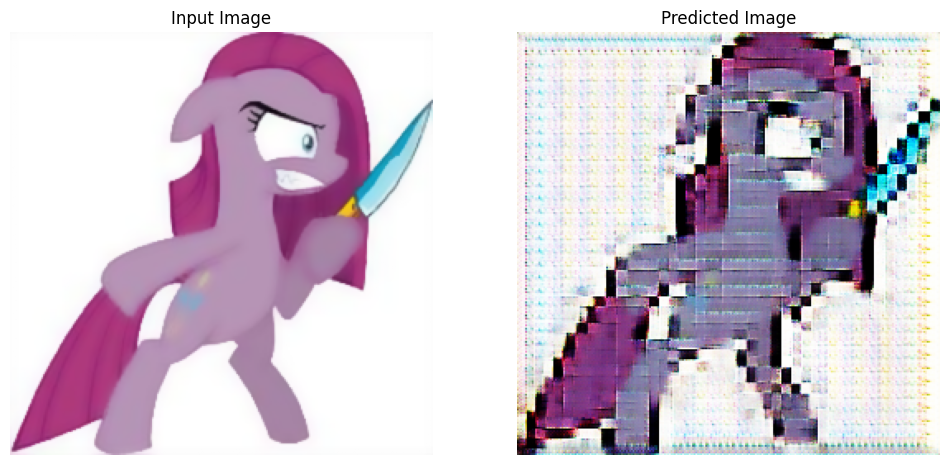

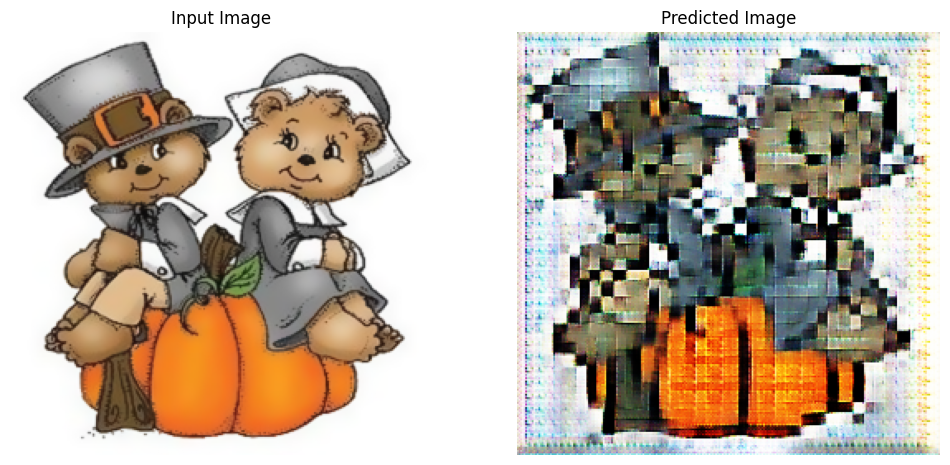

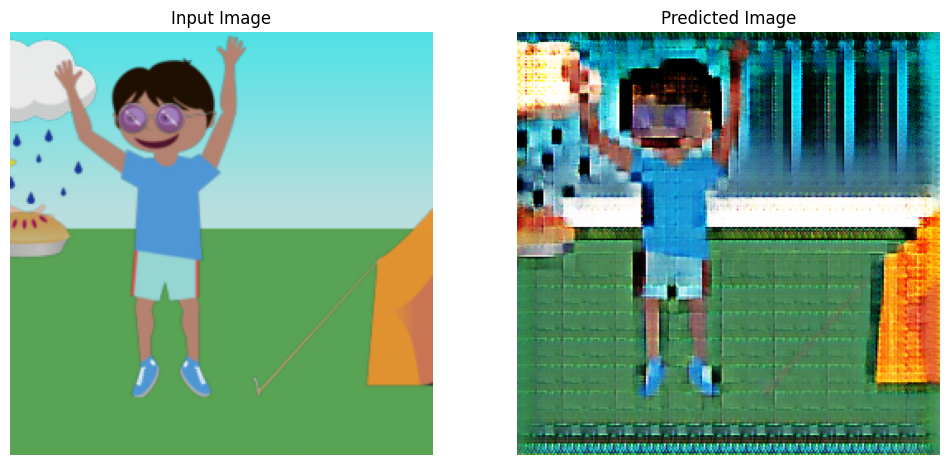

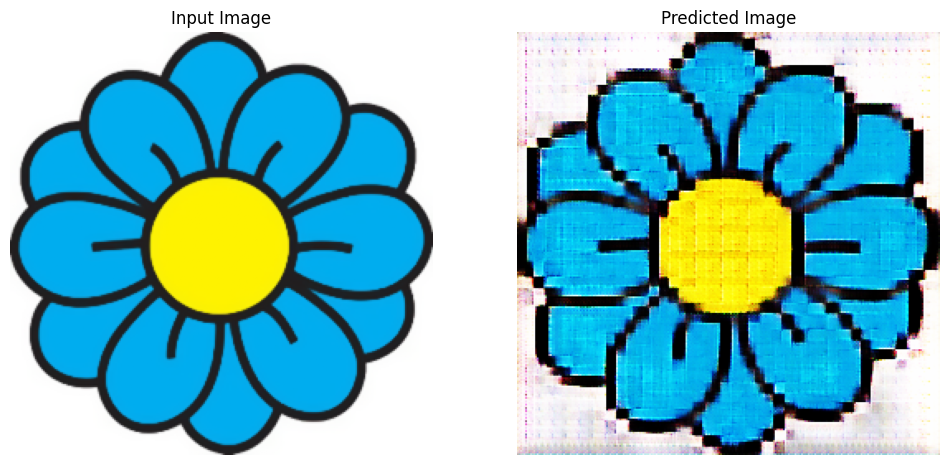

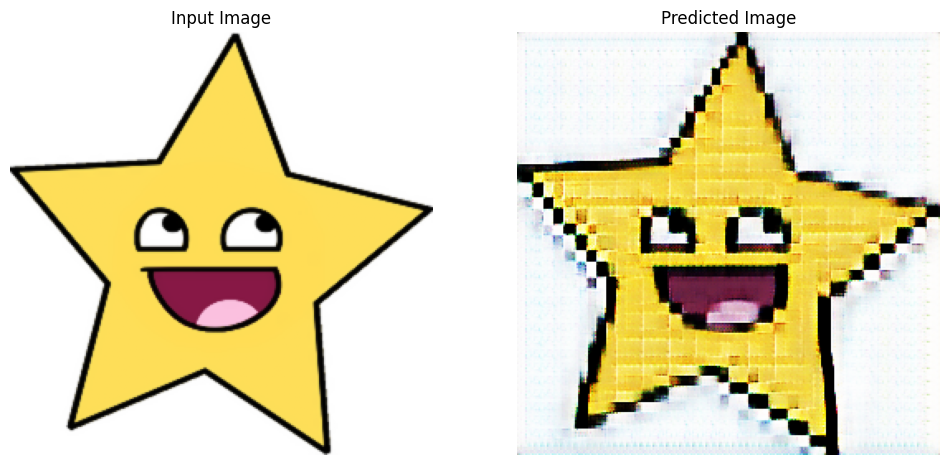

2025-01-05 13:18:16.241656: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [23]:
# Run the trained model on the test dataset
for inp in test_draw.take(5):
  generate_images(generator_g, inp)

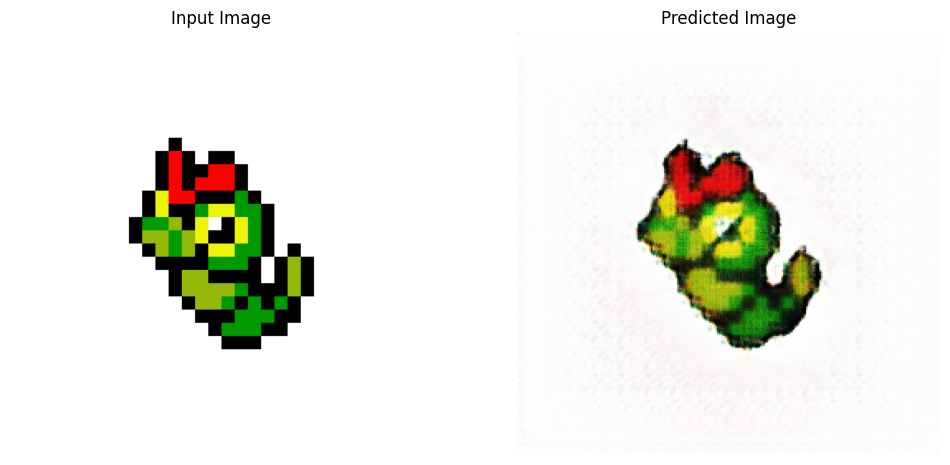

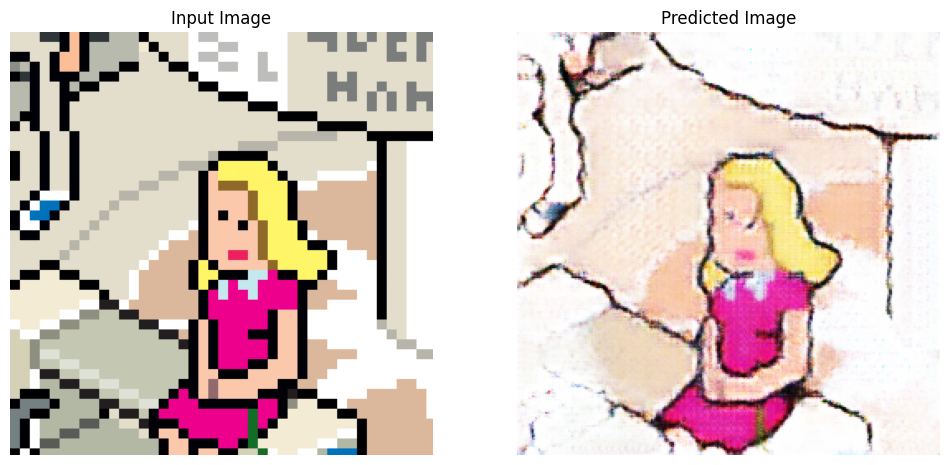

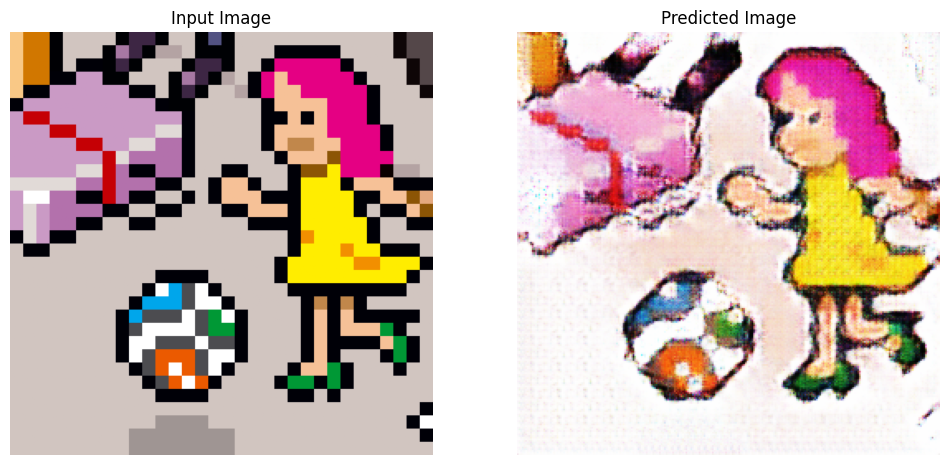

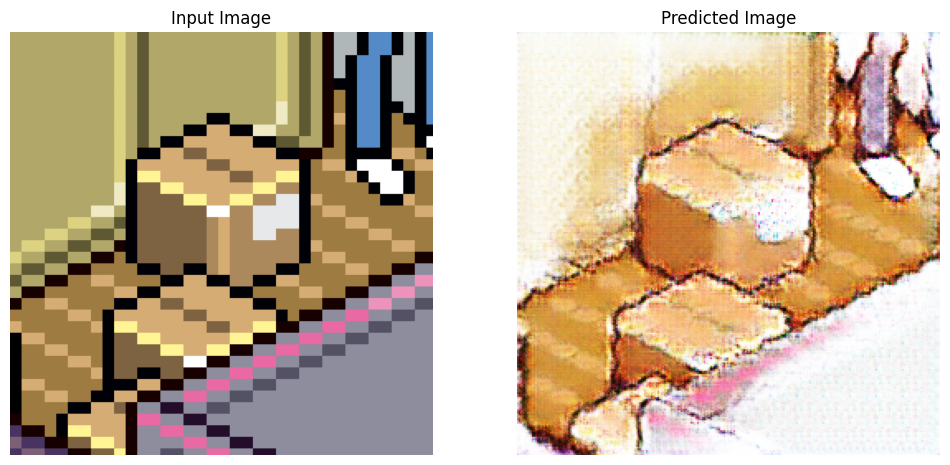

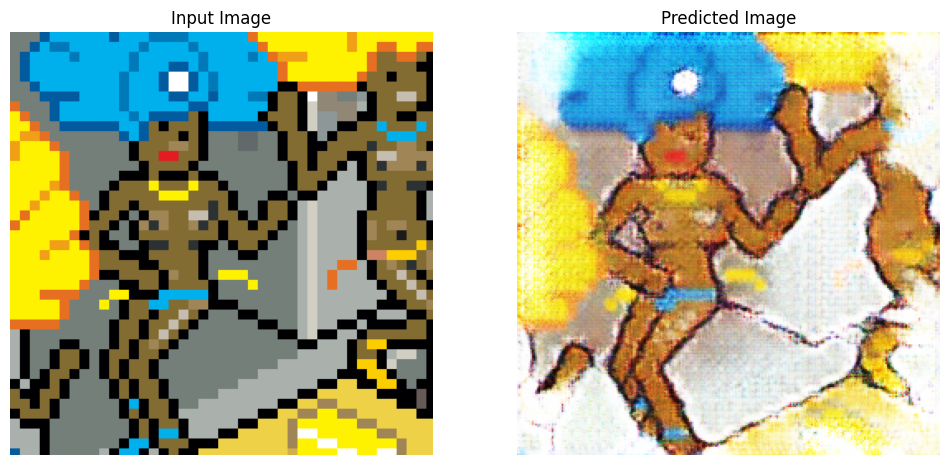

2025-01-05 13:19:20.781929: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [24]:
# Run the trained model on the test dataset
for inp in test_pix.take(5):
  generate_images(generator_f, inp)

## Generate with custom image

In [63]:
def load_process(path="../CustomImages/"):
  custom_dir = pathlib.Path(path)
  custom_ds = tf.keras.utils.image_dataset_from_directory(
    custom_dir,
    seed=123,
    image_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=None
  )

  # Split the test dataset into pix and draw
  test_cust_pix = filter_by_class(custom_ds, pix)
  test_cust_draw = filter_by_class(custom_ds, draw)

  test_cust_pix = test_cust_pix.map(
    preprocess_image_test, num_parallel_calls=AUTOTUNE).cache().batch(1)
  test_cust_draw = test_cust_draw.map(
    preprocess_image_test, num_parallel_calls=AUTOTUNE).cache().batch(1)
  return test_cust_draw, test_cust_pix

def custom_plot(test_cust_draw, test_cust_pix, pixDataset=True):  
  if pixDataset:
    for inp in test_cust_pix:
      if inp != None:
        generate_images(generator_g, inp)
      else:
        print(inp, "is None")
  else:
    for inp in test_cust_draw:
      if inp != None:
        generate_images(generator_f, inp)
      else:
        print(inp, "is None")

Found 5 files belonging to 2 classes.
 ----------- Draw to Pixel ----------- 


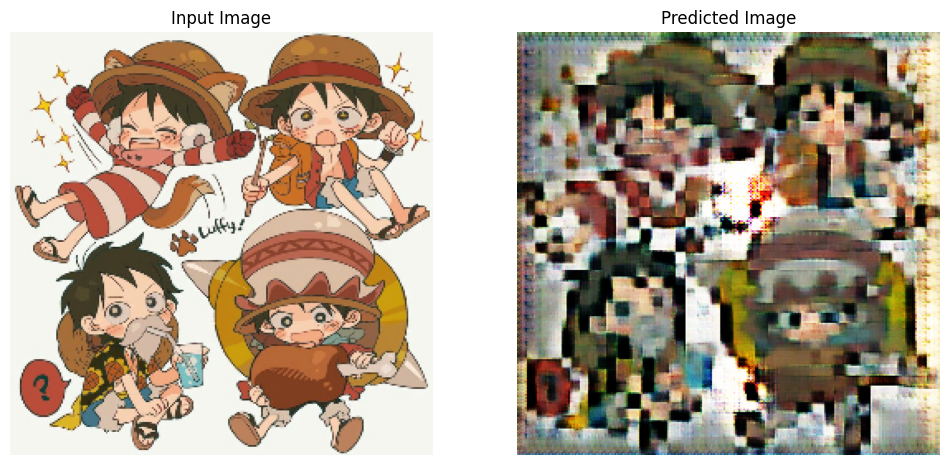

 ----------- Pixel to Draw ----------- 


2025-01-05 13:57:53.890962: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


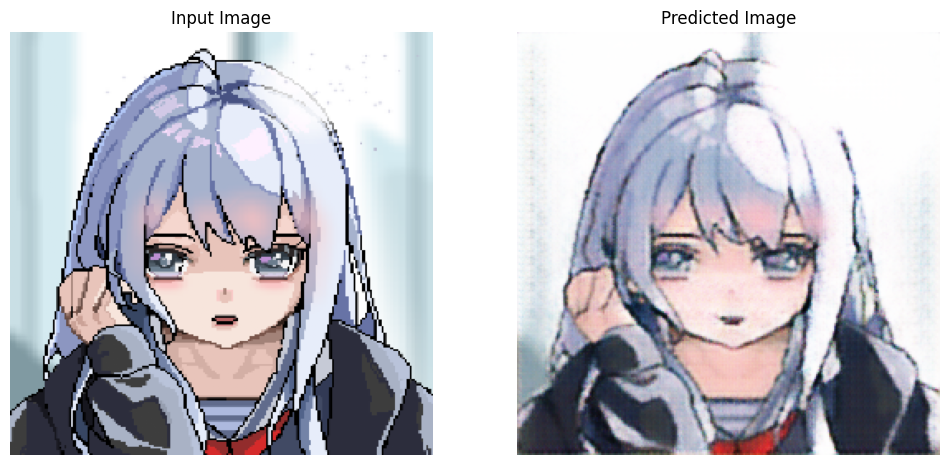

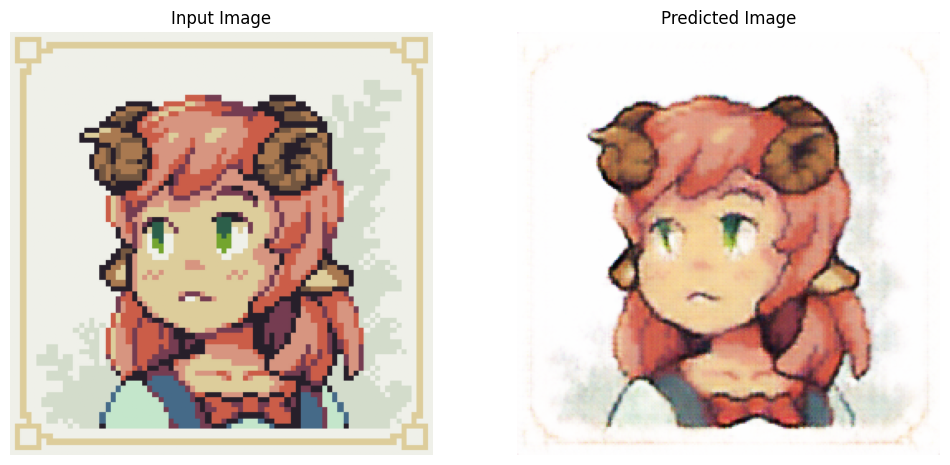

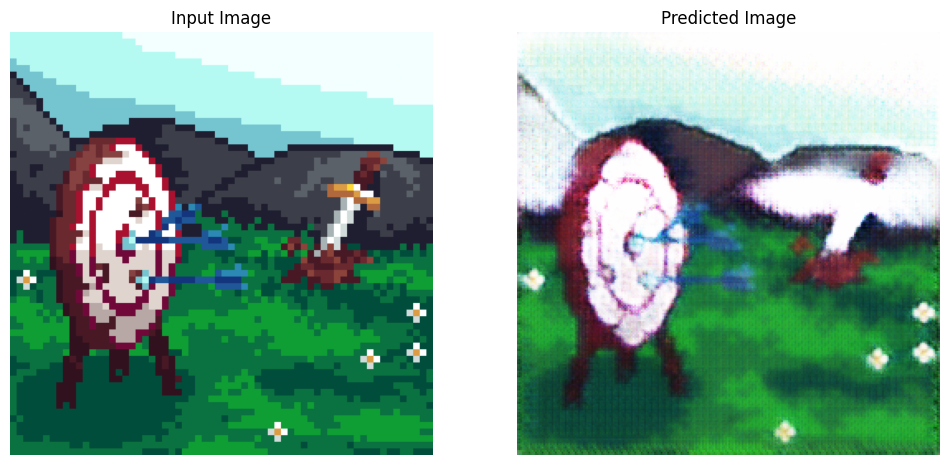

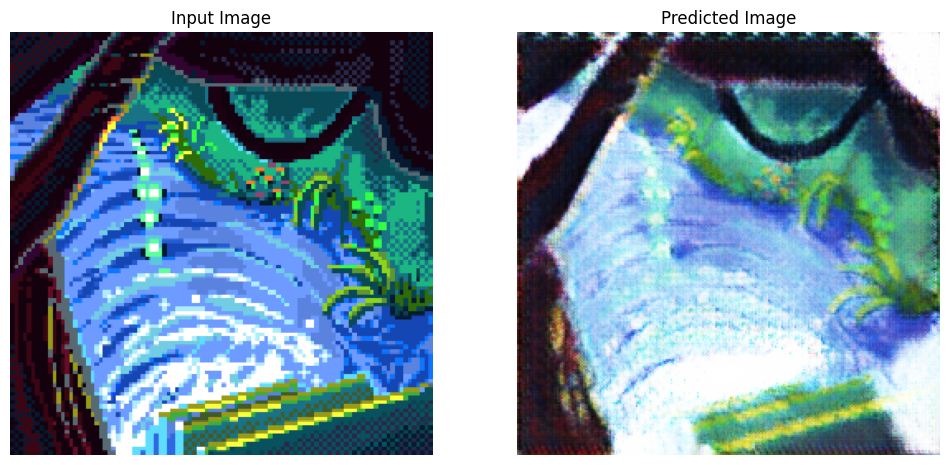

2025-01-05 13:57:54.672586: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [64]:
path = "../CustomImages/"
test_cust_draw, test_cust_pix = load_process(path)
print(" ----------- Draw to Pixel ----------- ")
custom_plot(test_cust_draw, test_cust_pix, True)
print(" ----------- Pixel to Draw ----------- ")
custom_plot(test_cust_draw, test_cust_pix, False)

## Next steps

This tutorial has shown how to implement CycleGAN starting from the generator and discriminator implemented in the [Pix2Pix](https://www.tensorflow.org/tutorials/generative/pix2pix) tutorial. As a next step, you could try using a different dataset from [TensorFlow Datasets](https://www.tensorflow.org/datasets/catalog/cycle_gan).

You could also train for a larger number of epochs to improve the results, or you could implement the modified ResNet generator used in the [paper](https://arxiv.org/abs/1703.10593) instead of the U-Net generator used here.